# 【ワーク 2 】 API での推論（AzureAIを使用した画像とテキスト分析）

Lab 1 にて作成した、Azure AIリソースを使用して、機械学習モデルを使用した推論を行います。
今回は画像処理を行います。

実装環境として Azure Machine Learning というサービスを利用します。  
Azure のトップページからリソースの作成をしてください。

![1](img/03/01.png)

リソース作成の設定を行います。
- リソースグループ：Azure AIとおなじもの
- 名前:一意の名前（例）demomlapp名字
- リージョン: Azure AI とおなじリージョン
![2](img/03/02.png)

入力ができたら、確認及び作成を行います。

作成後、作成した Azure ML リソースを開き、画像のようなスタジオの起動ボタンを選択します。

![3](img/03/03.png)

スタジオが起動できました。


### 【補足：コンピューティングインスタンスの作成】

Azure ML のホーム画面の左側の目次タブからコンピューティングを選択します。

![4](img/03/04.png)

コンピューティングから新規を選択します。
仮想マシンの種類が様々、ありますが、今回は一番オーソドックスなコンピューティングインスタンスを作成します。

![5](img/03/05.png)

+ 新規を選択後、下記のように設定を行い、コンピューティングの作成を行ってください。

- コンピューティング名: 名字+日付+名前の頭文字（koike0401a）
- 仮想マシンのサイズ: Standard_D2d_v5
- その他、デフォルト設定のまま作成を選択。

## Azure AI サービスを用いた推論

Notebook を開く。
下記の＋からファイルのアップロードを選択、[こちら](https://drive.google.com/file/d/1rdq7Ib6tfmhREoe02mO5Hkje9owa51st/view?usp=sharing)のNotebookをアップロードする。  

【ノートブックの設定】
- コンピューティング：Azure Machine Learning Serverless〜 を選択

![de](img/03/06.jpg)

ノートブックをアップロードし、リージョンとキーの置き換えができたら順に画像処理を実装していきましょう。　Shift + ENTER でコードを実行できます。

* 初めのコードの実行に時間がかかります。5分ほどコンピューティングの起動まで時間がかかることを認識して下さい。

エンドポイントとキーの確認は Azure のポータル上の Azure AI リソースから確認できます。

![7](img/03/07.jpg)



以下のコードがアップロードされたノートブックに含まれています。
コード自体を暗記する必要はないですがどのような手順でどのような処理を実装しているのか抑えましょう。  

### 環境構築

実装をするための環境の読み込みを行います。

In [45]:
!pip install azure-cognitiveservices-vision-computervision

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 50, Finished, Available)

In [46]:
#　モジュールの読み込み
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials
from PIL import Image
import os
# 下記でAzure AI サービスを利用するための認証情報を入力します。自身のAzure AIリソースからコピペを行ってください。*実務ではenvファイルなど別ファイルに認証情報は格納します。
key = 'キーに置き換える'
credentials = CognitiveServicesCredentials(key)
client = ComputerVisionClient(
    endpoint="エンドポイントに置き換える",
    credentials=credentials
)

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 51, Finished, Available)

In [47]:
import requests
import io
from io import BytesIO
import urllib
from urllib.request import urlopen

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 52, Finished, Available)

### 画像分析
まずは画像分析から行っていきます。
ComputerVisionClient というメソッドを使用するにことによって、次のことができます。

- 画像の分析: 顔、色、タグなど、特定の機能の画像を分析できます。
- 画像の説明を取得する: そのサブジェクト ドメインに基づいて画像の説明を取得します。

では実際にコードを実行してみましょう。

#### 分析を行う画像の読み込み

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 53, Finished, Available)

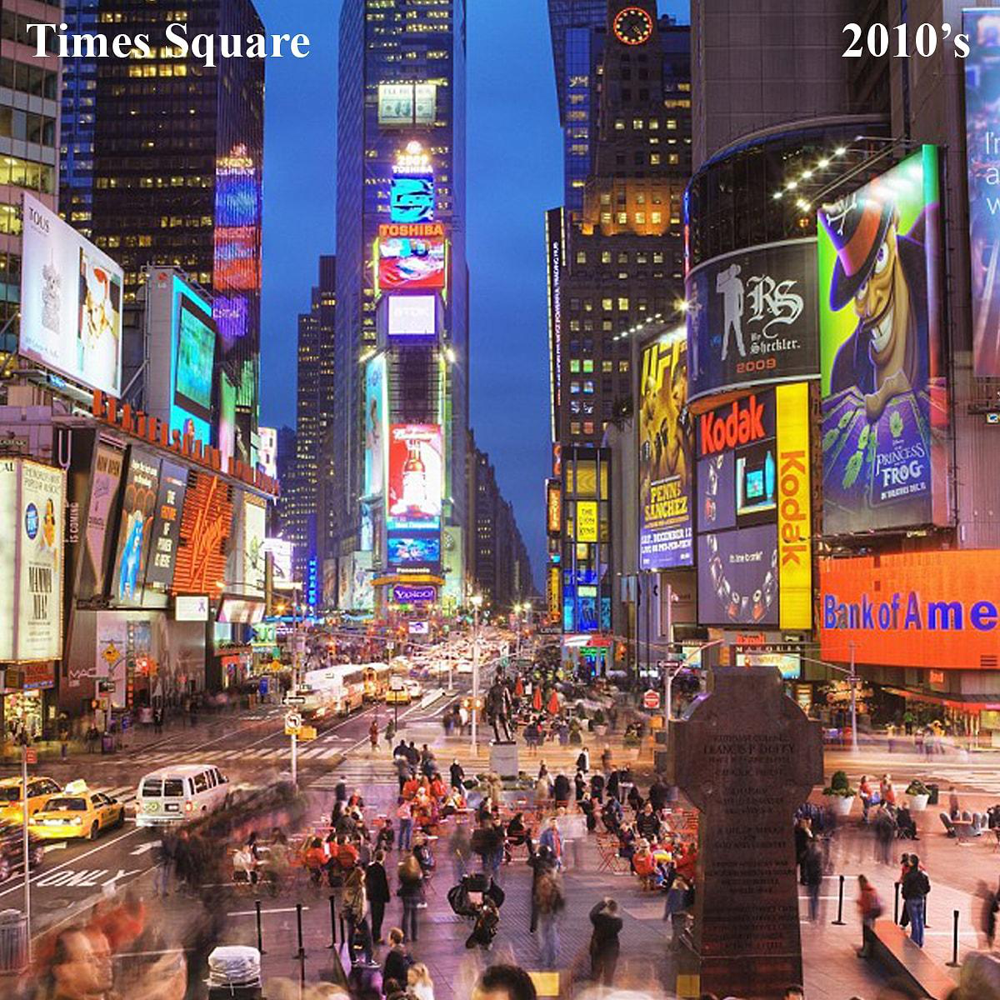

In [48]:

import requests
import numpy as np
from PIL import Image
from io import BytesIO

# 画像のURL
image_url = "https://img-s1.onedio.com/id-54a6b6cd791c244d1f69539d/rev-0/w-1200/h-1200/f-jpg/s-b4ac45e2de2fda761a0d739d5be75a62ec3652b1.jpg"

# 画像を取得
response = requests.get(image_url)
image_bytes = BytesIO(response.content)

# PILを使用して画像を開く
image_pil = Image.open(image_bytes)
display(image_pil)


上記の画像を使用し、分析を行います。まずは画像に写っている情報の検出を行いましょう。

### 画像分析の実装

In [49]:
# image_analytics で上の画像分析する
image_analysis = client.analyze_image(image_url,visual_features=[VisualFeatureTypes.tags])

for tag in image_analysis.tags:
    print(tag)

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 54, Finished, Available)

{'additional_properties': {}, 'name': 'text', 'confidence': 0.9896776080131531, 'hint': None}
{'additional_properties': {}, 'name': 'building', 'confidence': 0.9870737791061401, 'hint': None}
{'additional_properties': {}, 'name': 'billboard', 'confidence': 0.9549688100814819, 'hint': None}
{'additional_properties': {}, 'name': 'metropolitan area', 'confidence': 0.945885419845581, 'hint': None}
{'additional_properties': {}, 'name': 'metropolis', 'confidence': 0.931691586971283, 'hint': None}
{'additional_properties': {}, 'name': 'electronic signage', 'confidence': 0.9237869381904602, 'hint': None}
{'additional_properties': {}, 'name': 'downtown', 'confidence': 0.9228506684303284, 'hint': None}
{'additional_properties': {}, 'name': 'urban area', 'confidence': 0.917799174785614, 'hint': None}
{'additional_properties': {}, 'name': 'commercial building', 'confidence': 0.9163552522659302, 'hint': None}
{'additional_properties': {}, 'name': 'mixed-use', 'confidence': 0.9095696210861206, 'hint

建物、メトロポリス、ダウンタウン、外、街、人、ライトなど画像から様々な情報が取得できていることがわかります。
confidence はモデルの自信度を表しており、どのくらい予測結果に自身があるのかどうかを表しています。

確認をしてみると人（People）などは画像もぼやけており、自信度も低くなっていることがわかります。  

**可能な方は自身の好きな画像を使用し、推論を行ってみてください。image_url の URL を変更してみましょう**  
ほんの数コードで高度な画像処理を行うことができました。

### ランドマーク（建物の検出）

次にlist_models という種類のAIモデル表示します。

In [50]:
models = client.list_models()

for x in models.models_property:
    print(x)

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 55, Finished, Available)

{'additional_properties': {}, 'name': 'landmarks', 'categories': ['outdoor_', '户外_', '屋外_', 'aoarlivre_', 'alairelibre_', 'building_', '建筑_', '建物_', 'edifício_']}


こちらは画像から建物などを検出してくれるモデルとなっているようです。  
実際に使用してみましょう。  
他にも様々なモデルがあり、OCRや物体検出などが行えます。使用できるモデルは[こちら](https://learn.microsoft.com/ja-jp/python/api/azure-cognitiveservices-vision-computervision/azure.cognitiveservices.vision.computervision.operations.computervisionclientoperationsmixin?view=azure-python-preview)をご確認ください。
では、また画像を読み込み、推論を行ってみましょう。 

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 56, Finished, Available)

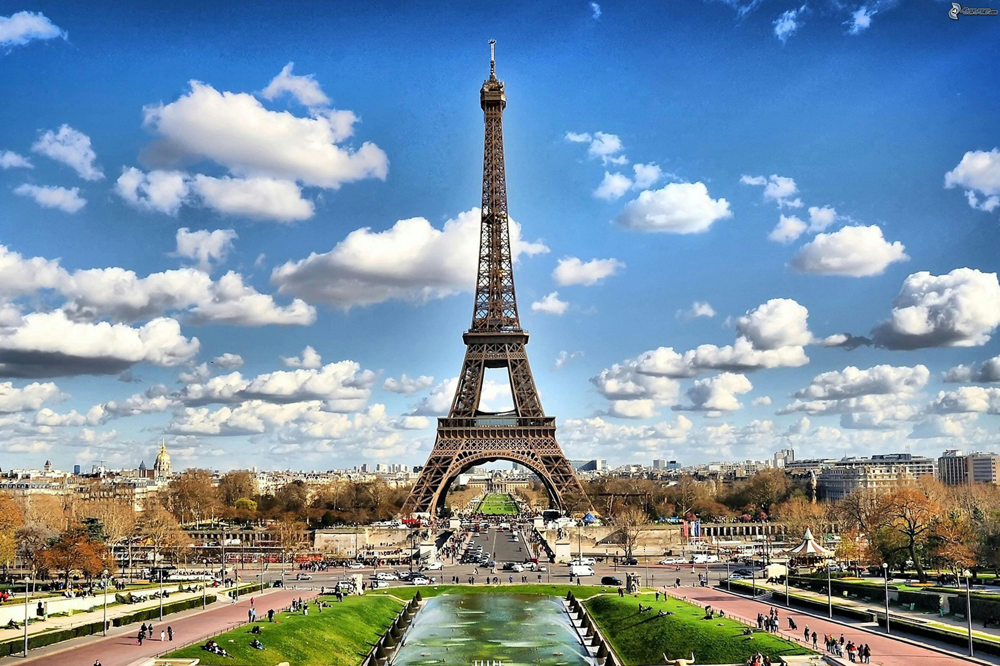

In [51]:
domain = "landmarks"
url = "https://images.pexels.com/photos/338515/pexels-photo-338515.jpeg"

# 画像を取得
response = requests.get(url)
image_bytes = BytesIO(response.content)

# PILを使用して画像を開く
image_pil = Image.open(image_bytes)
display(image_pil)

では、上記の画像を list_model に推論させてみましょう。

In [52]:
#画像のLandmarks の取得
language = "ja"

analysis = client.analyze_image_by_domain(domain, url, language)

for landmark in analysis.result["landmarks"]:
    print(landmark["name"])
    print(landmark["confidence"])

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 57, Finished, Available)

エッフェル塔
0.971265435218811


画像にエッフェル塔が写っていることを検出してくれています。  
また、コードにて言語（language)を日本語に設定しているため推論結果も日本語で検出されています。この用に英語だけではない多言語にも対応していることがわかりました。他にも有名人などをこのモデルでは検出することが可能です。

### 文章生成
最後に先程のエッフェル塔が検出された画像から画像の説明文の作成を行います。  
describe_image のメソッドを使用すると簡単に画像から説明文を作成してくれます。実際に実装してみましょう。

In [53]:
# 画像の説明文の作成
domain = "landmarks"
language = "ja"
max_descriptions = 3

analysis = client.describe_image(url, max_descriptions, language)

for caption in analysis.captions:
    print(caption.text)
    print(caption.confidence)

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 58, Finished, Available)

建物の前に立っているエッフェル塔
0.3260513366368707
時計台のあるエッフェル塔
0.3250513366368707
草の上に立っているエッフェル塔
0.3240513366368707


画像から説明文が生成されました。AI のConfidence（自信度）があまり高くないため少し違和感のある文章ではありますが、画像がどのような画像なのかは伝わるかと思います。

## Text Analytics

次に自然言語処理の実装を行います。Text Analyticsというサービスのセンチメント分析を行いましょう。  

文章中から感情を判断してくれます。  

In [54]:
!pip install azure-ai-textanalytics

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 59, Finished, Available)

In [55]:
from azure.ai.textanalytics import TextAnalyticsClient
endpoint="エンドポイントに置き換える"

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 60, Finished, Available)

In [56]:
text_analytics_client = TextAnalyticsClient(endpoint=endpoint, credential=AzureKeyCredential(key))

# あるスカイダイビングの口コミ
documents = [
    """人生で最高の日を過ごした。スカイダイビングに行くことを決めて、自分の人生全体にもっと感謝するようになった。
    インストラクターとも深い絆で結ばれ、彼女に生涯の友ができたような気がします。""",
    """これは時間の無駄だった。このドロップの景色はどれも非常に退屈で、私が見たのは草だけだった。0/10
    ダイバーには勧められない、""",
    """これはかなり良かった！景色はまあまあだったし、インストラクターと一緒に楽しめた！私の経験についてあまり文句を言うことはできない""",
    """私の経験には一言しかありません： WOW!!!！このような素晴らしいスカイダイビング会社が私の家のすぐ近くにあったなんて信じられません。
    私は間違いなくリピーターになるでしょう！私は間違いなくリピーターになり、私の祖母もスカイダイビングに連れて行きたいです、
    祖母もきっと気に入ると思います！"""
]

# Text Analyticsの実装
result = text_analytics_client.analyze_sentiment(documents, show_opinion_mining=True)
#結果の成形と表示
docs = [doc for doc in result if not doc.is_error]

print("Let's visualize the sentiment of each of these documents")
for idx, doc in enumerate(docs):
    print(f"Document text: {documents[idx]}")
    print(f"Overall sentiment: {doc.sentiment}")

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 61, Finished, Available)

Let's visualize the sentiment of each of these documents
Document text: 人生で最高の日を過ごした。スカイダイビングに行くことを決めて、自分の人生全体にもっと感謝するようになった。
    インストラクターとも深い絆で結ばれ、彼女に生涯の友ができたような気がします。
Overall sentiment: positive
Document text: これは時間の無駄だった。このドロップの景色はどれも非常に退屈で、私が見たのは草だけだった。0/10
    ダイバーには勧められない、
Overall sentiment: negative
Document text: これはかなり良かった！景色はまあまあだったし、インストラクターと一緒に楽しめた！私の経験についてあまり文句を言うことはできない
Overall sentiment: positive
Document text: 私の経験には一言しかありません： WOW!!!！このような素晴らしいスカイダイビング会社が私の家のすぐ近くにあったなんて信じられません。
    私は間違いなくリピーターになるでしょう！私は間違いなくリピーターになり、私の祖母もスカイダイビングに連れて行きたいです、
    祖母もきっと気に入ると思います！
Overall sentiment: positive


## Document Intelligence

レシートや領収書などの文字認識を行います。  
ただ文字認識を行うだけではなく、データのエンティティ（ロケーション・日程・住所）を保持しながらフォーム抽出を行います。  

[サンプルデータ](https://drive.google.com/file/d/1AUxcaJMCf3x-94pbClJCuLukO7HA2RiP/view?usp=drive_link)

In [57]:
!pip install azure-ai-formrecognizer azure-core

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 62, Finished, Available)

In [58]:
import time
from azure.ai.formrecognizer import DocumentAnalysisClient
from azure.core.credentials import AzureKeyCredential
from datetime import datetime

StatementMeta(b3e1c730-80e9-4c9b-ac16-f6e393b9ab8c, 0, 63, Finished, Available)

ダウンロードしたサンプルの領収書をこちらにアップロードします。  
本ノートブックをアップロードした手順と同様にファイルの追加→ファイルのアップロードと選択し、ダウンロードしました PDF ファイルをアップロードしてください。

In [ ]:
client = DocumentAnalysisClient(endpoint=endpoint, credential=AzureKeyCredential(key))


# ファイルを読み込んで
file_path = "Users/cloud（アカウント番号に置き換える）/Amazon.co.jp - 注文番号 503-5459522-3239010 (1).pdf"
#自身のアカウント番号に書き換えてください。アカウントのメールアドレスの @trainocate.biz の前の番号です。
with open(file_path, "rb") as file:
    print(f"{datetime.now()}: アップロード開始")

    # 分析開始
    poller = client.begin_analyze_document("prebuilt-document", file)

    # ステータスが完了になるまでポーリング
    while not poller.done():
        print(f"{datetime.now()}: Waiting...")
        time.sleep(3)

    # 結果を取得
    result = poller.result()
    print(result)

元の請求書の書式を保ったまま

実装は以上です。クラウドを使用して高度な画像処理を実装しました。最後に下記について考えてみましょう。

## まとめ

実装が終わったら下記について考えて見ましょう。

- Azure AI サービスでの画像処理とローカルでの画像処理モデルの違いはなんですか？
- Azure AI サービスのメリットはなんですか？
- Azure AI サービスのデメリット・考慮事項は何でしょうか？
- ローカルで画像処理モデルを構築し、活用する場合と Azure AI サービスはどの用に使い分けますか？
- ChatGPT など 生成 AI との違いはなんですか？
- 実装した AI はどのようなユースケースで使用できそうですか？


クラウドの推論モデルを使用し簡単に実装することができました。  
ビジネス目線でAPIモデルのメリットとデメリットを洗い出しましょう。  